### Import Libraries

In [856]:
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_svmlight_file
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

### Read data into Pandas 

In [857]:
diabetes= pd.read_csv('diabetes.csv')
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [858]:
diabetes.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [859]:
diabetes.corr() # correlation

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000000,0.129459,0.141282,-0.081672,-0.073535,0.017683,-0.033523,0.544341,0.221898
Glucose,0.129459,1.000000,0.152590,0.057328,0.331357,0.221071,0.137337,0.263514,0.466581
BloodPressure,0.141282,0.152590,1.000000,0.207371,0.088933,0.281805,0.041265,0.239528,0.065068
SkinThickness,-0.081672,0.057328,0.207371,1.000000,0.436783,0.392573,0.183928,-0.113970,0.074752
Insulin,-0.073535,0.331357,0.088933,0.436783,1.000000,0.197859,0.185071,-0.042163,0.130548
BMI,0.017683,0.221071,0.281805,0.392573,0.197859,1.000000,0.140647,0.036242,0.292695
DiabetesPedigreeFunction,-0.033523,0.137337,0.041265,0.183928,0.185071,0.140647,1.000000,0.033561,0.173844
Age,0.544341,0.263514,0.239528,-0.113970,-0.042163,0.036242,0.033561,1.000000,0.238356
Outcome,0.221898,0.466581,0.065068,0.074752,0.130548,0.292695,0.173844,0.238356,1.000000


### Plot correlation graph

In [860]:
df = pd.DataFrame(diabetes)
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm')

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000000,0.129459,0.141282,-0.081672,-0.073535,0.017683,-0.033523,0.544341,0.221898
Glucose,0.129459,1.000000,0.152590,0.057328,0.331357,0.221071,0.137337,0.263514,0.466581
BloodPressure,0.141282,0.152590,1.000000,0.207371,0.088933,0.281805,0.041265,0.239528,0.065068
SkinThickness,-0.081672,0.057328,0.207371,1.000000,0.436783,0.392573,0.183928,-0.113970,0.074752
Insulin,-0.073535,0.331357,0.088933,0.436783,1.000000,0.197859,0.185071,-0.042163,0.130548
BMI,0.017683,0.221071,0.281805,0.392573,0.197859,1.000000,0.140647,0.036242,0.292695
DiabetesPedigreeFunction,-0.033523,0.137337,0.041265,0.183928,0.185071,0.140647,1.000000,0.033561,0.173844
Age,0.544341,0.263514,0.239528,-0.113970,-0.042163,0.036242,0.033561,1.000000,0.238356
Outcome,0.221898,0.466581,0.065068,0.074752,0.130548,0.292695,0.173844,0.238356,1.000000


### Histogram for features

array([[<AxesSubplot:title={'center':'Pregnancies'}>,
        <AxesSubplot:title={'center':'Glucose'}>,
        <AxesSubplot:title={'center':'BloodPressure'}>],
       [<AxesSubplot:title={'center':'SkinThickness'}>,
        <AxesSubplot:title={'center':'Insulin'}>,
        <AxesSubplot:title={'center':'BMI'}>],
       [<AxesSubplot:title={'center':'DiabetesPedigreeFunction'}>,
        <AxesSubplot:title={'center':'Age'}>,
        <AxesSubplot:title={'center':'Outcome'}>]], dtype=object)

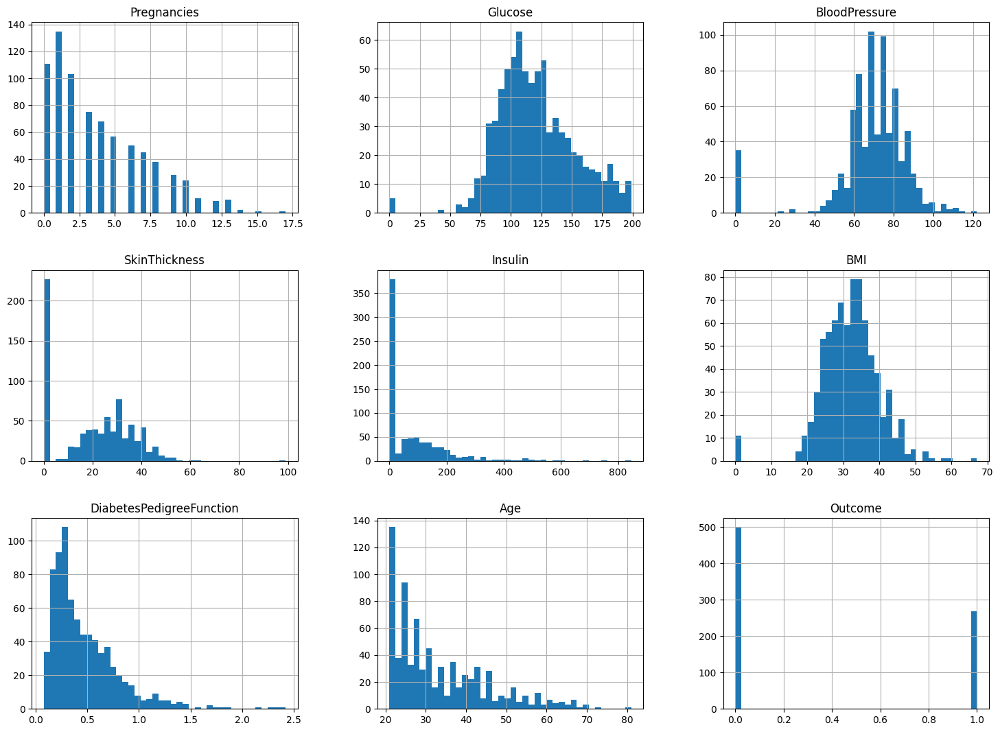

In [861]:
diabetes.hist(bins=40,figsize=(18,13))

In [862]:
diabetes.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

### Boxplots showing the variance in features

Pregnancies                    AxesSubplot(0.125,0.653529;0.227941x0.226471)
Glucose                     AxesSubplot(0.398529,0.653529;0.227941x0.226471)
BloodPressure               AxesSubplot(0.672059,0.653529;0.227941x0.226471)
SkinThickness                  AxesSubplot(0.125,0.381765;0.227941x0.226471)
Insulin                     AxesSubplot(0.398529,0.381765;0.227941x0.226471)
BMI                         AxesSubplot(0.672059,0.381765;0.227941x0.226471)
DiabetesPedigreeFunction           AxesSubplot(0.125,0.11;0.227941x0.226471)
Age                             AxesSubplot(0.398529,0.11;0.227941x0.226471)
Outcome                         AxesSubplot(0.672059,0.11;0.227941x0.226471)
dtype: object

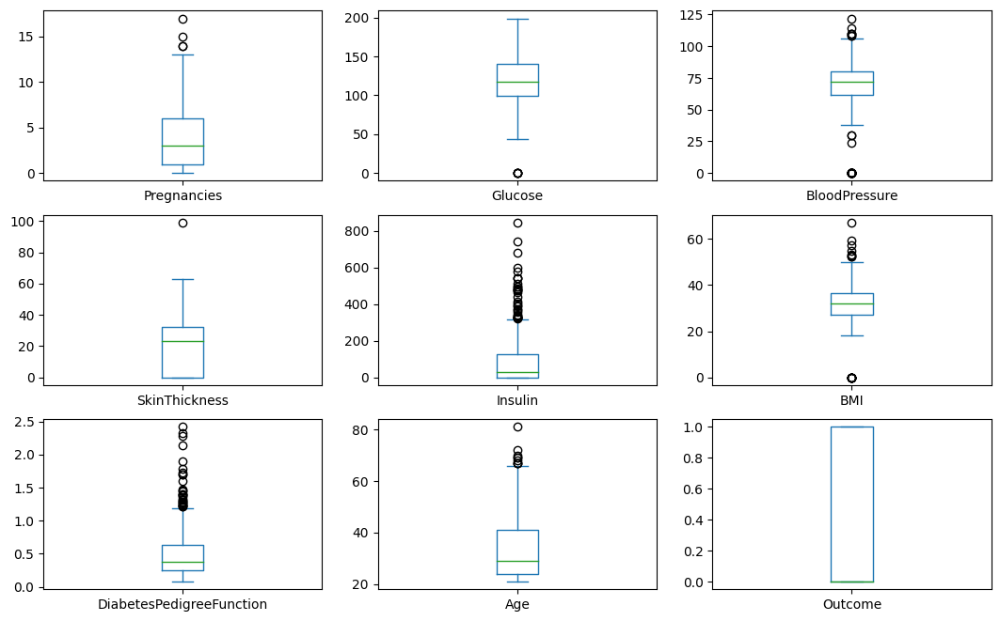

In [863]:
diabetes.plot(kind="box", subplots=True, layout=(3,3), figsize=(13,8)) # visualization of outliers

### Distribution of the data

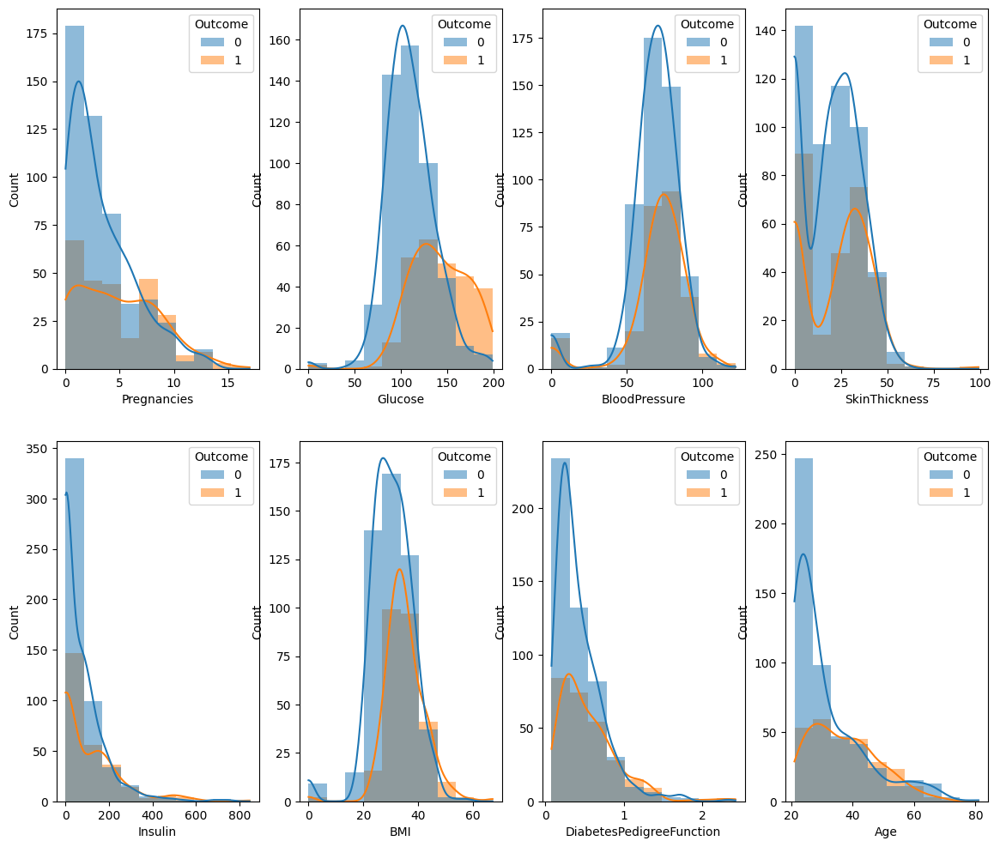

In [864]:

def plot_overlap():
    fig, axes = plt.subplots(2,4,figsize =(14,12))
    sns.histplot(data=diabetes, x=diabetes.columns[0], hue="Outcome", bins=10, kde=True, edgecolor=None,ax=axes[0,0])
    sns.histplot(data=diabetes, x=diabetes.columns[1], hue="Outcome", bins=10, kde=True, edgecolor=None,ax=axes[0,1])
    sns.histplot(data=diabetes, x=diabetes.columns[2], hue="Outcome", bins=10, kde=True, edgecolor=None,ax=axes[0,2])
    sns.histplot(data=diabetes, x=diabetes.columns[3], hue="Outcome", bins=10, kde=True, edgecolor=None,ax=axes[0,3])
    sns.histplot(data=diabetes, x=diabetes.columns[4], hue="Outcome", bins=10, kde=True, edgecolor=None,ax=axes[1,0])
    sns.histplot(data=diabetes, x=diabetes.columns[5], hue="Outcome", bins=10, kde=True, edgecolor=None,ax=axes[1,1])
    sns.histplot(data=diabetes, x=diabetes.columns[6], hue="Outcome", bins=10, kde=True, edgecolor=None,ax=axes[1,2])
    sns.histplot(data=diabetes, x=diabetes.columns[7], hue="Outcome", bins=10, kde=True, edgecolor=None,ax=axes[1,3])


plot_overlap()

# Main Implementation

Load data

In [865]:
dataset_x,dataset_y = load_svmlight_file("diabetes_scale.txt") # Load data usiing libsvm
dataset_y = dataset_y.reshape(dataset_y.shape[0],1)

In [866]:
dataset_x = pd.DataFrame(dataset_x.toarray()) # Convert dataset to dataframe

print(f"Size of feeatures: {dataset_x.shape}")
print(f"Size of labels: {dataset_y.shape}")

Size of feeatures: (768, 8)
Size of labels: (768, 1)


In [867]:
dataset_x['label'] = dataset_y # Adding labels to features dataframe
dataset_x.rename(columns={0:"Pregnancies", 1: "Glucose", 2: "Blood Pressure", 3: "SkinThickness", 4:"Insulin", 5: "BMI", 6: "DiabetesPedigree", 7: "Age"}) # Adding column names

,Pregnancies,Glucose,Blood Pressure,SkinThickness,Insulin,BMI,DiabetesPedigree,Age,label
0,-0.294118,0.487437,0.180328,-0.292929,-1.000000,0.001490,-0.531170,-0.033333,-1.0
1,-0.882353,-0.145729,0.081967,-0.414141,-1.000000,-0.207153,-0.766866,-0.666667,1.0
2,-0.058824,0.839196,0.049180,-1.000000,-1.000000,-0.305514,-0.492741,-0.633333,-1.0
3,-0.882353,-0.105528,0.081967,-0.535354,-0.777778,-0.162444,-0.923997,-1.000000,1.0
4,-1.000000,0.376884,-0.344262,-0.292929,-0.602837,0.284650,0.887276,-0.600000,-1.0
...,...,...,...,...,...,...,...,...,...
763,0.176471,0.015075,0.245902,-0.030303,-0.574468,-0.019374,-0.920581,0.400000,1.0
764,-0.764706,0.226131,0.147541,-0.454545,-1.000000,0.096870,-0.776260,-0.800000,1.0
765,-0.411765,0.216080,0.180328,-0.535354,-0.735225,-0.219076,-0.857387,-0.700000,1.0
766,-0.882353,0.266332,-0.016393,-1.000000,-1.000000,-0.102832,-0.768574,-0.133333,-1.0


In [868]:
data = dataset_x.values
data

array([[-0.294118 ,  0.487437 ,  0.180328 , ..., -0.53117  , -0.0333333,
        -1.       ],
       [-0.882353 , -0.145729 ,  0.0819672, ..., -0.766866 , -0.666667 ,
         1.       ],
       [-0.0588235,  0.839196 ,  0.0491803, ..., -0.492741 , -0.633333 ,
        -1.       ],
       ...,
       [-0.411765 ,  0.21608  ,  0.180328 , ..., -0.857387 , -0.7      ,
         1.       ],
       [-0.882353 ,  0.266332 , -0.0163934, ..., -0.768574 , -0.133333 ,
        -1.       ],
       [-0.882353 , -0.0653266,  0.147541 , ..., -0.797609 , -0.933333 ,
         1.       ]])

Splitting data

In [869]:
train_prepoc, test_set = train_test_split(data, test_size = 0.1, random_state = 42, shuffle = True, stratify = data[:,-1]) # Split data into training and testing data
train_set, val_set = train_test_split(train_prepoc, test_size = 0.11, random_state = 42, shuffle = True, stratify = train_prepoc[:,-1]) # Split training data into training data and validation data

# Separating labels from features

y_train = train_set[:,-1]
y_val = val_set[:,-1]
y_test = test_set[:,-1]

x_train = train_set[:,0:-1]
x_val = val_set[:,0:-1]
x_test = test_set[:,0:-1]

In [870]:
accuracy_dict = {} # Initialise empty dictionary to store accuracies.

# Base Perceptron

### Sklearn implementation for baseline

In [871]:
from sklearn.linear_model import Perceptron
model = Perceptron(tol=1e-3, random_state=0)
model.fit(x_train, y_train)

Perceptron()

In [872]:
X_new_test=np.concatenate((x_val,x_test))
y_new_test=np.concatenate((y_val,y_test))

In [873]:
new_pred=model.predict(X_new_test)

In [874]:
from sklearn.metrics import accuracy_score
sklearn_accuracy = accuracy_score(y_new_test,new_pred)

accuracy_dict["Sklearn model"] = sklearn_accuracy

print(sklearn_accuracy)

0.7337662337662337


In [875]:
accuracy_dict


{'Sklearn model': 0.7337662337662337}

### Defining Functions

#### Initialise weights

In [876]:
def base_initialise_weights(weight_val): # Initialise weights as zeros

    weights = np.zeros(dataset_x.shape[1]-1)
    return weights


def loss_func(loss_type, features, labels, weights): # Claculate loss for different types of losses

    sum_loss = 0
    for row, label in zip(features, labels):

        if(loss_type == "zero-one"): # Loss for Zero-one loss
            sum_loss += base_step_func(row, label, weights)

        elif(loss_type == "perceptron"): # Loss for Perceptron Loss
            sum_loss += max(0, -1*label*(np.dot(row, weights)))

    return sum_loss/features.shape[0]


def base_step_func(feature, label, weights): # Threshold function

    step = (1 if np.dot(feature, weights) * label <= 0 else 0)
    return step


def base_update_weights(features, labels, features_val, labels_val, weights, eeta, loss_type): # Function to update weights

    sum = 0
    
    # Calculate sum of errors for each epoch

    for row, label in zip(features, labels):
        sum = sum + (label * row * (base_step_func(row, label, weights)))

    weights = weights + (eeta * sum)
    
    # Predicting outcomes for training and validation data sets

    preds_train, acc_train = pred_accuracy(features, labels, weights)
    preds_val, acc_val = pred_accuracy(features_val, labels_val, weights)

    # Calculating loss for traininng and validation data

    loss_train = loss_func(loss_type, features, labels, weights)
    loss_val = loss_func(loss_type, features_val, labels_val, weights)

    return weights, acc_train, acc_val, loss_train, loss_val


def base_train(features, labels, val_features, val_labels, epochs, eeta, loss_type,  weight_val): # Function to train data for multiple epochs

    # Initialising empty variables and lists

    best_accuracy = 0
    acc_train_list = []
    acc_val_list = []
    loss_train_list = []
    loss_val_list = []
    best_weight = []

    weights = base_initialise_weights(weight_val) # Call function to initialise weights

    print(f"\nInitial weights:\n{weights}\n") # Print initialised weights

    for i in range(epochs):

        weights, acc_train, acc_val, loss_train, loss_val = base_update_weights(x_train, y_train, x_val, y_val, weights, eeta, loss_type) # Call function to update weights

        # Print results for each epoch
        print(f"Epoch {i}:\n Training Accuracy = {acc_train},\n Validation Accuracy = {acc_val},\n Training loss = {loss_train},\n validation loss = {loss_val}\n--------------")

        # Append values to respective lists
        acc_train_list.append(acc_train)
        acc_val_list.append(acc_val)
        loss_train_list.append(loss_train)
        loss_val_list.append(loss_val)

        # Find best accuracy among all epochs
        if best_accuracy < acc_val:
            best_accuracy = acc_val
            best_weight = weights

    print(f"///// Best Accuracy = {best_accuracy*100} % /////")

    return best_accuracy, best_weight, acc_train_list, acc_val_list, loss_train_list, loss_val_list



def pred_accuracy(features, labels, weights): # Function to find accuracy score for predictions
    preds = np.sign(np.dot(features, weights))

    count = 0
    for i, j in zip(preds, labels):
        if i == j:
            count+=1
    
    accuracy = count/features.shape[0]

    return preds, accuracy

In [877]:
# Initialise parameters
epochs = 50
eeta = 0.01
weight_val = 0
loss_type = "perceptron"

# Call function to start training modelf
best_accuracy, best_weight, acc_train_list, acc_val_list, loss_train_list, loss_val_list = base_train(x_train, y_train, x_val, y_val, epochs, eeta, loss_type, weight_val) #, bias)


Initial weights:
[0. 0. 0. 0. 0. 0. 0. 0.]

Epoch 0:
 Training Accuracy = 0.6498371335504886,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 1.428249895493418,
 validation loss = 1.5738815472881658
--------------
Epoch 1:
 Training Accuracy = 0.739413680781759,
 Validation Accuracy = 0.7012987012987013,
 Training loss = 0.17198815290349923,
 validation loss = 0.2070962350814942
--------------
Epoch 2:
 Training Accuracy = 0.3501628664495114,
 Validation Accuracy = 0.35064935064935066,
 Training loss = 1.0478374487844597,
 validation loss = 1.0654197170726747
--------------
Epoch 3:
 Training Accuracy = 0.6514657980456026,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 2.0132421594998413,
 validation loss = 2.23385135455806
--------------
Epoch 4:
 Training Accuracy = 0.6791530944625407,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.7141648509696192,
 validation loss = 0.7985503038716837
--------------
Epoch 5:
 Training Accuracy = 0.5700325732

In [878]:
def base_predict(features, labels, weights): #, bias):
    
    # if bias:
    #     features = bias_column(features)

    prediction, accuracy = pred_accuracy(features, labels, best_weight)

    return prediction, accuracy

In [879]:
preds, acc_test = pred_accuracy(x_test, y_test, best_weight) # Predict outputs for test data
print(f"Accuracy for test data is: {acc_test*100} %")

# Add test accuracy to the dictionary
accuracy_dict["Weights: Zero, Bias: False"] = acc_test

Accuracy for test data is: 71.42857142857143 %


In [880]:
# Classification report

print(classification_report(y_test, preds))

              precision    recall  f1-score   support

        -1.0       0.59      0.63      0.61        27
         1.0       0.79      0.76      0.78        50

    accuracy                           0.71        77
   macro avg       0.69      0.69      0.69        77
weighted avg       0.72      0.71      0.72        77



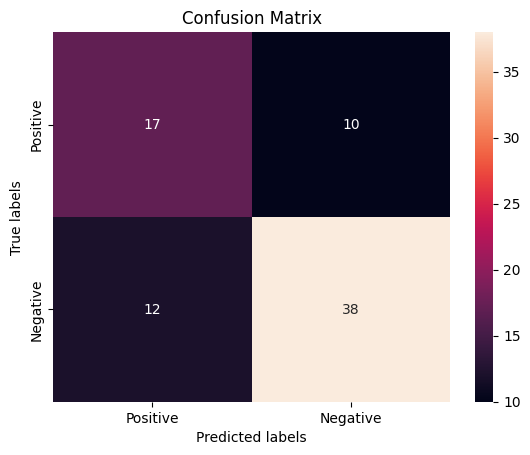

In [881]:
cmat = confusion_matrix(y_test, preds)
sns.heatmap(cmat,annot=True)
ax= plt.subplot()
sns.heatmap(cmat, annot=True, fmt='g', ax=ax);
# labels, title and ticks
plt.title('Confusion Matrix')
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['Positive', 'Negative']); ax.yaxis.set_ticklabels(['Positive', 'Negative']);
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

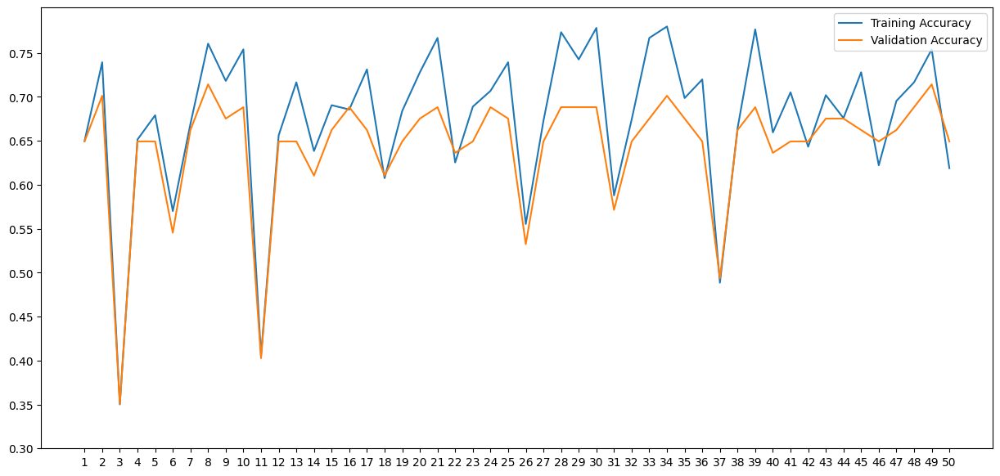

In [882]:
# Plot for testing and validation accuracy

plt.figure(figsize = [15,7])
plt.plot(np.arange(1, epochs+1), acc_train_list, label = "Training Accuracy")
plt.plot(np.arange(1, epochs+1), acc_val_list, label = "Validation Accuracy")
plt.legend(loc = "upper right")
plt.xticks(np.arange(1, epochs+1, step = 1))
plt.yticks(np.arange(0.3, 0.8, step = 0.05))
plt.show

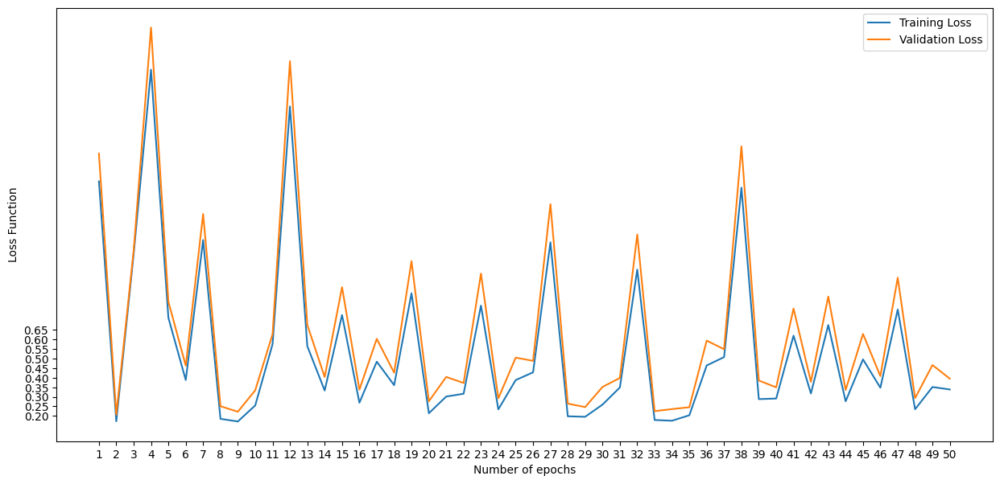

In [883]:
# Plot for testing and validation loss

plt.figure(figsize = [15,7])
plt.plot(np.arange(1, epochs+1), loss_train_list, label = "Training Loss")
plt.plot(np.arange(1, epochs+1), loss_val_list, label = "Validation Loss")
plt.xlabel("Number of epochs")
plt.ylabel("Loss Function")
plt.xticks(np.arange(1, epochs+1, step = 1))
plt.yticks(np.arange(0.2, 0.7, step = 0.05))
plt.legend(loc = "upper right")
plt.show()

# Experiments

In [884]:
# Function to add a column to the data

def bias_column(array):
    return np.append(np.ones(array.shape[0]).reshape(array.shape[0],1), array, axis= 1)

In [885]:
# Initialise different weights with/without bias

def initialise_weights(features, weight_val, bias = False):

    if weight_val == 1:
        if bias:
            weights = np.ones(features.shape[1]+1)
        else:
            weights = np.ones(features.shape[1])
    
    elif weight_val == 0:
        if bias:
            weights = np.zeros(features.shape[1]+1)
        else:
            weights = np.zeros(features.shape[1])

    else:
        if bias:
            weights = np.random.rand(features.shape[1]+1)
        else:
            weights = np.random.rand(features.shape[1])

    return weights


# Function to update weights

def update_weights(features, labels, features_val, labels_val, weights, eeta, loss_type, bias = False):

    # If bias = True
    if bias:
        features = bias_column(features)
        features_val = bias_column(features_val)


    sum = 0
    
    # Update weights
    for row, label in zip(features, labels):
        sum = sum + (label * row * (base_step_func(row, label, weights)))

    weights = weights + (eeta * sum)
    
    # Calculate accuracy
    preds_train, acc_train = pred_accuracy(features, labels, weights)
    preds_val, acc_val = pred_accuracy(features_val, labels_val, weights)

    # Calculate loss
    loss_train = loss_func(loss_type, features, labels, weights)
    loss_val = loss_func(loss_type, features_val, labels_val, weights)

    return weights, acc_train, acc_val, loss_train, loss_val

# Function to train model
def train(features, labels, val_features, val_labels, epochs, eeta, loss_type, weight_val, bias = False):
    best_accuracy = 0
    acc_train_list = []
    acc_val_list = []
    loss_train_list = []
    loss_val_list = []
    best_weight = []

    weights = initialise_weights(features, weight_val, bias)

    print(f"\nInitial weights:\n{weights}\n")

    for i in range(epochs):
        weights, acc_train, acc_val, loss_train, loss_val = update_weights(x_train, y_train, x_val, y_val, weights, eeta, loss_type, bias)
        
        print(f"Epoch {i}:\n Training Accuracy = {acc_train},\n Validation Accuracy = {acc_val},\n Training loss = {loss_train},\n validation loss = {loss_val}\n--------------")

        # Append accuracy and loss values to lists
        acc_train_list.append(acc_train)
        acc_val_list.append(acc_val)
        loss_train_list.append(loss_train)
        loss_val_list.append(loss_val)

        if best_accuracy < acc_val:
            best_accuracy = acc_val
            best_weight = weights

    print(f"///// Best Accuracy = {best_accuracy} /////")

    return best_accuracy, best_weight, acc_train_list, acc_val_list, loss_train_list, loss_val_list

In [886]:
def predict(features, labels, weights, bias): # Function to predict outputs
    
    if bias:
        features = bias_column(features)

    prediction, accuracy = pred_accuracy(features, labels, best_weight)

    return prediction, accuracy

### Experiments with random weights

#### Random weights

In [887]:
epochs = 50
eeta = 0.01
bias = False
weight_val = 3
loss_type = "zero-one"

# training data with random weights
best_accuracy, best_weight, acc_train_list, acc_val_list, loss_train_list, loss_val_list = train(x_train, y_train, x_val, y_val, epochs, eeta, loss_type, weight_val, bias)


Initial weights:
[0.48224936 0.10832305 0.86943951 0.09224614 0.95577147 0.97916106
 0.1593939  0.39347059]

Epoch 0:
 Training Accuracy = 0.6498371335504886,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3501628664495114,
 validation loss = 0.35064935064935066
--------------
Epoch 1:
 Training Accuracy = 0.6498371335504886,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3501628664495114,
 validation loss = 0.35064935064935066
--------------
Epoch 2:
 Training Accuracy = 0.38599348534201955,
 Validation Accuracy = 0.35064935064935066,
 Training loss = 0.6140065146579805,
 validation loss = 0.6493506493506493
--------------
Epoch 3:
 Training Accuracy = 0.6498371335504886,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3501628664495114,
 validation loss = 0.35064935064935066
--------------
Epoch 4:
 Training Accuracy = 0.6612377850162866,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.33876221498371334,
 validation loss = 0.3

In [888]:
# Predictions for random weights

preds, acc_test = predict(x_test, y_test, best_weight, bias)
print(f"Accuracy for test data is: {acc_test*100} %")

accuracy_dict["Weights: Random, Bias: False"] = acc_test

Accuracy for test data is: 77.92207792207793 %


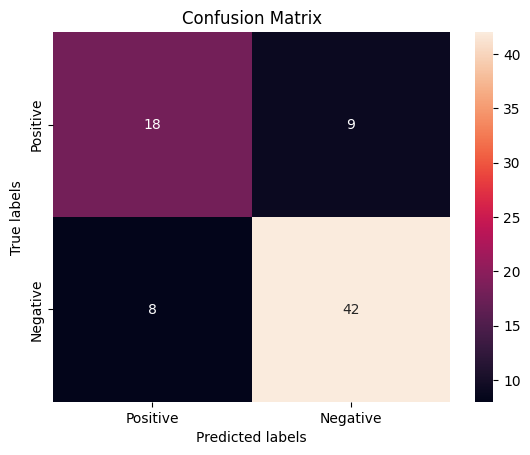

In [889]:
cmat = confusion_matrix(y_test, preds)
sns.heatmap(cmat,annot=True)
ax= plt.subplot()
sns.heatmap(cmat, annot=True, fmt='g', ax=ax);
# labels, title and ticks
plt.title('Confusion Matrix')
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['Positive', 'Negative']); ax.yaxis.set_ticklabels(['Positive', 'Negative']);
plt.show()

#### Ones weights

In [890]:
epochs = 50
eeta = 0.01
bias = False
weight_val = 1
loss_type = "zero-one"

# Training model with ones weights
best_accuracy, best_weight, acc_train_list, acc_val_list, loss_train_list, loss_val_list = train(x_train, y_train, x_val, y_val, epochs, eeta, loss_type, weight_val, bias)


Initial weights:
[1. 1. 1. 1. 1. 1. 1. 1.]

Epoch 0:
 Training Accuracy = 0.6514657980456026,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3485342019543974,
 validation loss = 0.35064935064935066
--------------
Epoch 1:
 Training Accuracy = 0.6498371335504886,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3501628664495114,
 validation loss = 0.35064935064935066
--------------
Epoch 2:
 Training Accuracy = 0.3501628664495114,
 Validation Accuracy = 0.35064935064935066,
 Training loss = 0.6498371335504886,
 validation loss = 0.6493506493506493
--------------
Epoch 3:
 Training Accuracy = 0.6498371335504886,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3501628664495114,
 validation loss = 0.35064935064935066
--------------
Epoch 4:
 Training Accuracy = 0.6579804560260586,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.34201954397394135,
 validation loss = 0.35064935064935066
--------------
Epoch 5:
 Training Accuracy = 0.36

In [891]:
best_weight

array([-0.91117683, -3.67301427,  0.32098336, -0.3100017 ,  0.0065476 ,
       -1.65617008, -0.65280063, -0.82133344])

In [892]:
# Prediction for Ones weights

preds, acc_test = predict(x_test, y_test, best_weight, bias)
print(f"Accuracy for test data is: {acc_test*100} %")

accuracy_dict["Weights: Ones, Bias: False"] = acc_test

Accuracy for test data is: 71.42857142857143 %


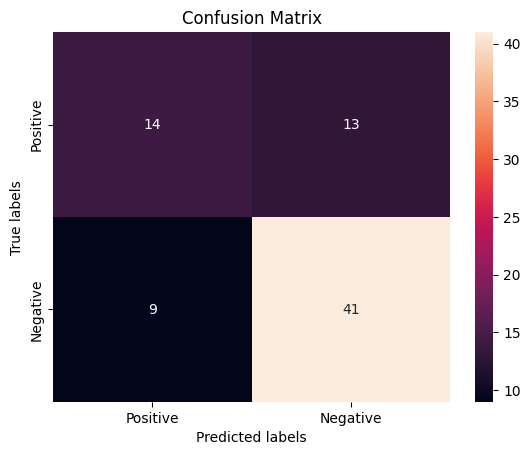

In [893]:
cmat = confusion_matrix(y_test, preds)
sns.heatmap(cmat,annot=True)
ax= plt.subplot()
sns.heatmap(cmat, annot=True, fmt='g', ax=ax);
# labels, title and ticks
plt.title('Confusion Matrix')
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['Positive', 'Negative']); ax.yaxis.set_ticklabels(['Positive', 'Negative']);
plt.show()

## Experiments with bias

#### Zero weights with bias

In [894]:
epochs = 50
eeta = 0.01
bias = True
weight_val = 0


# Training model with zero weights and bias
best_accuracy, best_weight, acc_train_list, acc_val_list, loss_train_list, loss_val_list = train(x_train, y_train, x_val, y_val, epochs, eeta, loss_type, weight_val, bias)


Initial weights:
[0. 0. 0. 0. 0. 0. 0. 0. 0.]

Epoch 0:
 Training Accuracy = 0.6514657980456026,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3485342019543974,
 validation loss = 0.35064935064935066
--------------
Epoch 1:
 Training Accuracy = 0.749185667752443,
 Validation Accuracy = 0.6753246753246753,
 Training loss = 0.250814332247557,
 validation loss = 0.3246753246753247
--------------
Epoch 2:
 Training Accuracy = 0.3517915309446254,
 Validation Accuracy = 0.35064935064935066,
 Training loss = 0.6482084690553745,
 validation loss = 0.6493506493506493
--------------
Epoch 3:
 Training Accuracy = 0.6514657980456026,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3485342019543974,
 validation loss = 0.35064935064935066
--------------
Epoch 4:
 Training Accuracy = 0.6530944625407166,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3469055374592834,
 validation loss = 0.35064935064935066
--------------
Epoch 5:
 Training Accuracy = 0.519

In [895]:
preds, acc_test = predict(x_test, y_test, best_weight, bias) # Predicting outputs for zero weights and bias
print(f"Accuracy for test data is: {acc_test*100} %")

accuracy_dict["Weights: Zero, Bias: True"] = acc_test

Accuracy for test data is: 71.42857142857143 %


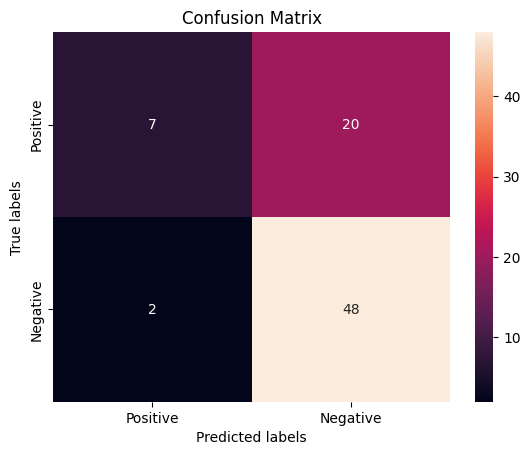

In [896]:
cmat = confusion_matrix(y_test, preds)
sns.heatmap(cmat,annot=True)
ax= plt.subplot()
sns.heatmap(cmat, annot=True, fmt='g', ax=ax);
# labels, title and ticks
plt.title('Confusion Matrix')
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['Positive', 'Negative']); ax.yaxis.set_ticklabels(['Positive', 'Negative']);
plt.show()

#### Ones weights with bias

In [897]:
epochs = 50
eeta = 0.01
bias = True
weight_val = 1

# Train model with ones weights and bias
best_accuracy, best_weight, acc_train_list, acc_val_list, loss_train_list, loss_val_list = train(x_train, y_train, x_val, y_val, epochs, eeta, loss_type, weight_val, bias)


Initial weights:
[1. 1. 1. 1. 1. 1. 1. 1. 1.]

Epoch 0:
 Training Accuracy = 0.6514657980456026,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3485342019543974,
 validation loss = 0.35064935064935066
--------------
Epoch 1:
 Training Accuracy = 0.6514657980456026,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3485342019543974,
 validation loss = 0.35064935064935066
--------------
Epoch 2:
 Training Accuracy = 0.3485342019543974,
 Validation Accuracy = 0.35064935064935066,
 Training loss = 0.6514657980456026,
 validation loss = 0.6493506493506493
--------------
Epoch 3:
 Training Accuracy = 0.6514657980456026,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3485342019543974,
 validation loss = 0.35064935064935066
--------------
Epoch 4:
 Training Accuracy = 0.6514657980456026,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3485342019543974,
 validation loss = 0.35064935064935066
--------------
Epoch 5:
 Training Accuracy = 0.

In [898]:
preds, acc_test = predict(x_test, y_test, best_weight, bias) # Predicting outputs for ones weights and bias
print(f"Accuracy for test data is: {acc_test*100} %")

accuracy_dict["Weights: Ones, Bias: True"] = acc_test

Accuracy for test data is: 72.72727272727273 %


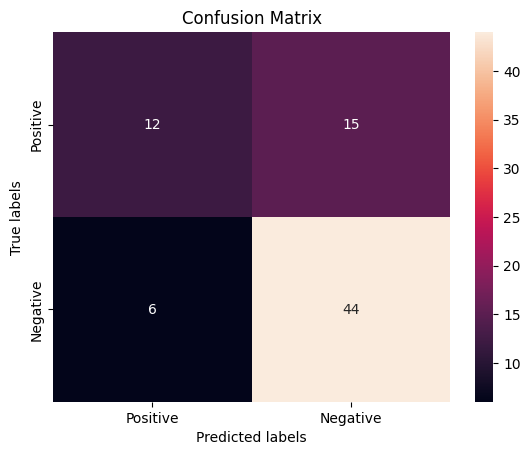

In [899]:
cmat = confusion_matrix(y_test, preds)
sns.heatmap(cmat,annot=True)
ax= plt.subplot()
sns.heatmap(cmat, annot=True, fmt='g', ax=ax);
# labels, title and ticks
plt.title('Confusion Matrix')
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['Positive', 'Negative']); ax.yaxis.set_ticklabels(['Positive', 'Negative']);
plt.show()

In [900]:
epochs = 50
eeta = 0.01
bias = True
weight_val = 3

# Train model with random weights and bias
best_accuracy, best_weight, acc_train_list, acc_val_list, loss_train_list, loss_val_list = train(x_train, y_train, x_val, y_val, epochs, eeta, loss_type, weight_val, bias)


Initial weights:
[0.8306773  0.35023862 0.31144926 0.10507192 0.04365867 0.82711619
 0.21919591 0.13914157 0.71325172]

Epoch 0:
 Training Accuracy = 0.6514657980456026,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3485342019543974,
 validation loss = 0.35064935064935066
--------------
Epoch 1:
 Training Accuracy = 0.6514657980456026,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3485342019543974,
 validation loss = 0.35064935064935066
--------------
Epoch 2:
 Training Accuracy = 0.3485342019543974,
 Validation Accuracy = 0.35064935064935066,
 Training loss = 0.6514657980456026,
 validation loss = 0.6493506493506493
--------------
Epoch 3:
 Training Accuracy = 0.6514657980456026,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3485342019543974,
 validation loss = 0.35064935064935066
--------------
Epoch 4:
 Training Accuracy = 0.6514657980456026,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3485342019543974,
 validation l

In [901]:
preds, acc_test = predict(x_test, y_test, best_weight, bias) # Predicting outputs for random weights and bias
print(f"Accuracy for test data is: {acc_test*100} %")

accuracy_dict["Weights: Random, Bias: True"] = acc_test

Accuracy for test data is: 70.12987012987013 %


In [902]:
accuracy_dict

{'Sklearn model': 0.7337662337662337,
 'Weights: Zero, Bias: False': 0.7142857142857143,
 'Weights: Random, Bias: False': 0.7792207792207793,
 'Weights: Ones, Bias: False': 0.7142857142857143,
 'Weights: Zero, Bias: True': 0.7142857142857143,
 'Weights: Ones, Bias: True': 0.7272727272727273,
 'Weights: Random, Bias: True': 0.7012987012987013}

### Experiments with loss function

In [903]:
epochs = 50
eeta = 0.01
bias = True
weight_val = 0


# Initialise dictionary for storing accuracy for different losses
loss_dict = {}

bias_list = [True, False]
weight_list = [0,1,2]
loss_list = ["zero-one", "perceptron"]

for i in loss_list:
    for j in bias_list:
        for k in weight_list:

            print(i,j,k)

            # Train and predict model for different combinations of losses
            best_accuracy, best_weight, acc_train_list, acc_val_list, loss_train_list, loss_val_list = train(x_train, y_train, x_val, y_val, epochs, eeta, i, k, j)

            preds, acc_test = predict(x_test, y_test, best_weight, j)

            # Code for printing weights as texts
            if k == 0:
                k = "Zero Weights"
            elif k ==1:
                k = "One Weights"
            else:
                k = "Random Weights"

            loss_dict[f"Loss: {i}, Bias: {j}, Weights: {k}"] = acc_test*100


zero-one True 0

Initial weights:
[0. 0. 0. 0. 0. 0. 0. 0. 0.]

Epoch 0:
 Training Accuracy = 0.6514657980456026,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3485342019543974,
 validation loss = 0.35064935064935066
--------------
Epoch 1:
 Training Accuracy = 0.749185667752443,
 Validation Accuracy = 0.6753246753246753,
 Training loss = 0.250814332247557,
 validation loss = 0.3246753246753247
--------------
Epoch 2:
 Training Accuracy = 0.3517915309446254,
 Validation Accuracy = 0.35064935064935066,
 Training loss = 0.6482084690553745,
 validation loss = 0.6493506493506493
--------------
Epoch 3:
 Training Accuracy = 0.6514657980456026,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3485342019543974,
 validation loss = 0.35064935064935066
--------------
Epoch 4:
 Training Accuracy = 0.6530944625407166,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3469055374592834,
 validation loss = 0.35064935064935066
--------------
Epoch 5:
 Training 

In [904]:
loss_dict

{'Loss: zero-one, Bias: True, Weights: Zero Weights': 71.42857142857143,
 'Loss: zero-one, Bias: True, Weights: One Weights': 72.72727272727273,
 'Loss: zero-one, Bias: True, Weights: Random Weights': 72.72727272727273,
 'Loss: zero-one, Bias: False, Weights: Zero Weights': 71.42857142857143,
 'Loss: zero-one, Bias: False, Weights: One Weights': 71.42857142857143,
 'Loss: zero-one, Bias: False, Weights: Random Weights': 74.02597402597402,
 'Loss: perceptron, Bias: True, Weights: Zero Weights': 71.42857142857143,
 'Loss: perceptron, Bias: True, Weights: One Weights': 72.72727272727273,
 'Loss: perceptron, Bias: True, Weights: Random Weights': 70.12987012987013,
 'Loss: perceptron, Bias: False, Weights: Zero Weights': 71.42857142857143,
 'Loss: perceptron, Bias: False, Weights: One Weights': 71.42857142857143,
 'Loss: perceptron, Bias: False, Weights: Random Weights': 70.12987012987013}

### Experiments with Epochs

In [905]:
eeta = 0.01
bias = False
weight_val = 3
loss_type = "zero-one"

# Initialise empty dictionary to stroe accuracy for different epochs
epoch_dict = {}

# Epoch list
epoch_list = [10, 50, 100, 500, 1000, 3000, 8000, 10000, 20000]

for i in epoch_list:

    # Train and predict model for different combinations of epochs
    best_accuracy, best_weight, acc_train_list, acc_val_list, loss_train_list, loss_val_list = train(x_train, y_train, x_val, y_val, i, eeta, loss_type, weight_val, bias)

    preds, acc_test = predict(x_test, y_test, best_weight, bias)


    epoch_dict[f"Number of epochs: {i}"] = acc_test*100 


Initial weights:
[0.93085822 0.19570875 0.12694719 0.82798656 0.04131497 0.4571132
 0.67753105 0.53985671]

Epoch 0:
 Training Accuracy = 0.6498371335504886,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3501628664495114,
 validation loss = 0.35064935064935066
--------------
Epoch 1:
 Training Accuracy = 0.6547231270358306,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.34527687296416937,
 validation loss = 0.35064935064935066
--------------
Epoch 2:
 Training Accuracy = 0.3550488599348534,
 Validation Accuracy = 0.35064935064935066,
 Training loss = 0.6449511400651465,
 validation loss = 0.6493506493506493
--------------
Epoch 3:
 Training Accuracy = 0.6530944625407166,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3469055374592834,
 validation loss = 0.35064935064935066
--------------
Epoch 4:
 Training Accuracy = 0.6677524429967426,
 Validation Accuracy = 0.6493506493506493,
 Training loss = 0.3322475570032573,
 validation loss = 0.350

In [906]:
epoch_dict

{'Number of epochs: 10': 80.51948051948052,
 'Number of epochs: 50': 72.72727272727273,
 'Number of epochs: 100': 80.51948051948052,
 'Number of epochs: 500': 72.72727272727273,
 'Number of epochs: 1000': 75.32467532467533,
 'Number of epochs: 3000': 70.12987012987013,
 'Number of epochs: 8000': 70.12987012987013,
 'Number of epochs: 10000': 74.02597402597402,
 'Number of epochs: 20000': 79.22077922077922}

Tell that after a certain number of epochs, it doesn't make a difference.

### Experiments with Learning Rate

In [907]:
epochs = 500
bias = False
weight_val = 3
loss_type = "zero-one"

eeta_dict = {}

# learning rate list to be tested
eeta_list = [1e-5, 1e-4, 1e-3, 0.01, 0.1, 1, 10, 100]

for i in eeta_list:

    # Train and predict model for different combinations of learning rates
    best_accuracy, best_weight, acc_train_list, acc_val_list, loss_train_list, loss_val_list = train(x_train, y_train, x_val, y_val, epochs, i, loss_type, weight_val, bias)

    preds, acc_test = predict(x_test, y_test, best_weight, bias)

    eeta_dict[f"Learning rate: {i}"] = best_accuracy*100 


Initial weights:
[0.81984155 0.1180012  0.24410732 0.01601269 0.33808806 0.47422954
 0.6879047  0.26193752]

Epoch 0:
 Training Accuracy = 0.34039087947882735,
 Validation Accuracy = 0.35064935064935066,
 Training loss = 0.6596091205211726,
 validation loss = 0.6493506493506493
--------------
Epoch 1:
 Training Accuracy = 0.34039087947882735,
 Validation Accuracy = 0.35064935064935066,
 Training loss = 0.6596091205211726,
 validation loss = 0.6493506493506493
--------------
Epoch 2:
 Training Accuracy = 0.34039087947882735,
 Validation Accuracy = 0.36363636363636365,
 Training loss = 0.6596091205211726,
 validation loss = 0.6363636363636364
--------------
Epoch 3:
 Training Accuracy = 0.34039087947882735,
 Validation Accuracy = 0.36363636363636365,
 Training loss = 0.6596091205211726,
 validation loss = 0.6363636363636364
--------------
Epoch 4:
 Training Accuracy = 0.34039087947882735,
 Validation Accuracy = 0.36363636363636365,
 Training loss = 0.6596091205211726,
 validation loss =

In [ ]:
eeta_dict

{'Learning rate: 1e-05': 41.55844155844156,
 'Learning rate: 0.0001': 70.12987012987013,
 'Learning rate: 0.001': 71.42857142857143,
 'Learning rate: 0.01': 72.72727272727273,
 'Learning rate: 0.1': 71.42857142857143,
 'Learning rate: 1': 71.42857142857143,
 'Learning rate: 10': 71.42857142857143,
 'Learning rate: 100': 71.42857142857143}

In [ ]:
epochs = 20
bias = False
weight_val = 3
loss_type = "zero-one"

eeta_dict = {}

# learning rate list to be tested
eeta_list = [1e-5, 1e-4, 1e-3, 0.01, 0.1, 1, 10, 100]

for i in eeta_list:

    # Train and predict model for different combinations of learning rates
    best_accuracy, best_weight, acc_train_list, acc_val_list, loss_train_list, loss_val_list = train(x_train, y_train, x_val, y_val, epochs, i, loss_type, weight_val, bias)

    preds, acc_test = predict(x_test, y_test, best_weight, bias)

    eeta_dict[f"Learning rate: {i}"] = best_accuracy*100 


Initial weights:
[0.90369912 0.69392474 0.26970015 0.9347728  0.50456631 0.57978759
 0.67988744 0.10879173]

Epoch 0:
 Training Accuracy = 0.34039087947882735,
 Validation Accuracy = 0.33766233766233766,
 Training loss = 0.6596091205211726,
 validation loss = 0.6623376623376623
--------------
Epoch 1:
 Training Accuracy = 0.34039087947882735,
 Validation Accuracy = 0.33766233766233766,
 Training loss = 0.6596091205211726,
 validation loss = 0.6623376623376623
--------------
Epoch 2:
 Training Accuracy = 0.34039087947882735,
 Validation Accuracy = 0.33766233766233766,
 Training loss = 0.6596091205211726,
 validation loss = 0.6623376623376623
--------------
Epoch 3:
 Training Accuracy = 0.34039087947882735,
 Validation Accuracy = 0.33766233766233766,
 Training loss = 0.6596091205211726,
 validation loss = 0.6623376623376623
--------------
Epoch 4:
 Training Accuracy = 0.34039087947882735,
 Validation Accuracy = 0.33766233766233766,
 Training loss = 0.6596091205211726,
 validation loss =

In [ ]:
eeta_dict

{'Learning rate: 1e-05': 33.76623376623377,
 'Learning rate: 0.0001': 61.038961038961034,
 'Learning rate: 0.001': 68.83116883116884,
 'Learning rate: 0.01': 68.83116883116884,
 'Learning rate: 0.1': 70.12987012987013,
 'Learning rate: 1': 71.42857142857143,
 'Learning rate: 10': 71.42857142857143,
 'Learning rate: 100': 68.83116883116884}

## ADALINE

In [ ]:
np.seterr(all='warn')

# Function to update weights for the model
def update_weights3(features, labels, features_val, labels_val, eeta, epochs, loss_type, weight_val, bias = False):

    # Initialise weights
    weights = initialise_weights(features, weight_val, bias)
    print(f"\nInitial weights:\n{weights}\n")

    best_accuracy = 0
    acc_train_list = []
    acc_val_list = []
    loss_train_list = []
    loss_val_list = []
    best_weight = []
    mse_list =[]

    if bias:
        features = bias_column(features)
        features_val = bias_column(features_val)


    sum = 0

    error = 0.0
    
    for i in range(epochs):
        
        for row, label in zip(features, labels):
            
            # Dot product
            prod = np.dot(row, weights)
            
            # Calculate MSE
            error = error + pow((prod - label), 2)

            gradient = 2*(label-prod)

            # Adjust weights
            weights = weights + (eeta*(2*(gradient)*row))

            mse = ((label - prod)**2).sum()/len(labels)

            mse_list.append(mse)

            preds_train, acc_train = pred_accuracy(features, labels, weights)
            preds_val, acc_val = pred_accuracy(features_val, labels_val, weights)

            loss_train = loss_func(loss_type, features, labels, weights)
            loss_val = loss_func(loss_type, features_val, labels_val, weights)

            acc_train_list.append(acc_train)
            acc_val_list.append(acc_val)
            loss_train_list.append(loss_train)
            loss_val_list.append(loss_val)

            # Calculate best accuracy
            if best_accuracy < acc_val:
                best_accuracy = acc_val
                best_weight = weights

    print(f"///// Best Accuracy = {best_accuracy} /////")

    return best_accuracy, best_weight, acc_train_list, acc_val_list, loss_train_list, loss_val_list, mse_list

In [ ]:
# Function to train ADALINE model
def train3(features, labels, val_features, val_labels, epochs, eeta, weight_val, bias = False):
    best_accuracy = 0
    acc_train_list = []
    acc_val_list = []
    loss_train_list = []
    loss_val_list = []
    best_weight = []

    # Initialise weights
    weights = initialise_weights(weight_val, bias)

    print(f"\nInitial weights:\n{weights}\n")
 
    # Loop to call function to update weights
    for i in range(epochs):
        weights, acc_train, acc_val, loss_train, loss_val, mse_list = update_weights3(x_train, y_train, x_val, y_val, weights, eeta, bias)

        print(f"Epoch {i}:\n Training Accuracy = {acc_train},\n Validation Accuracy = {acc_val},\n Training loss = {loss_train},\n validation loss = {loss_val}\n--------------")


    print(f"///// Best Accuracy = {best_accuracy} /////")

    return best_accuracy, best_weight, acc_train_list, acc_val_list, loss_train_list, loss_val_list, mse_list

In [ ]:
epochs= 20
eeta = 0.01
bias = True
weight_val = 3
loss_type = "zero-one"

# Call to train model with above parameters
best_accuracy, best_weight, acc_train_list, acc_val_list, loss_train_list, loss_val_list, mse_list = update_weights3(x_train, y_train, x_val, y_val, eeta, epochs, loss_type, weight_val, bias)


Initial weights:
[0.63117413 0.46990396 0.31138767 0.59572284 0.48489271 0.64949812
 0.7011273  0.26074503 0.52419636]

///// Best Accuracy = 0.7532467532467533 /////


In [ ]:
preds, acc_test = predict(x_test, y_test, best_weight, bias) # Predict output fot test data
print(f"Accuracy for test data is: {acc_test*100} %")

accuracy_dict["Adeline, Weights: Random, Bias: False"] = acc_test

Accuracy for test data is: 77.92207792207793 %


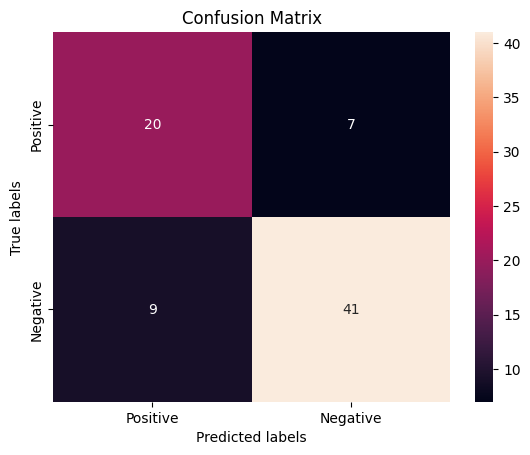

In [ ]:
cmat = confusion_matrix(y_test, preds)
sns.heatmap(cmat,annot=True)
ax= plt.subplot()
sns.heatmap(cmat, annot=True, fmt='g', ax=ax);
# labels, title and ticks
plt.title('Confusion Matrix')
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['Positive', 'Negative']); ax.yaxis.set_ticklabels(['Positive', 'Negative']);
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

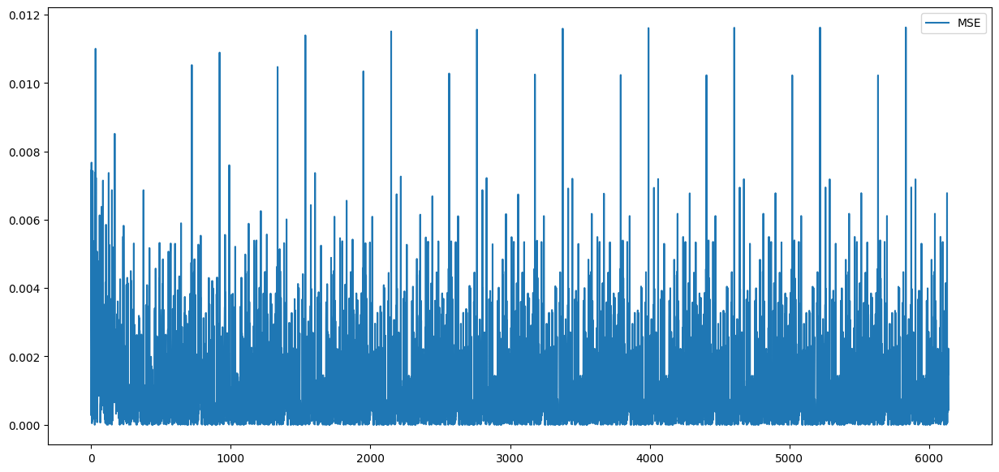

In [ ]:
# Plot for mse vs number of iterations
plt.figure(figsize = [15,7])
plt.plot(np.arange(0, epochs*len(y_train)), mse_list, label = "MSE")
plt.legend(loc = "upper right")

plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

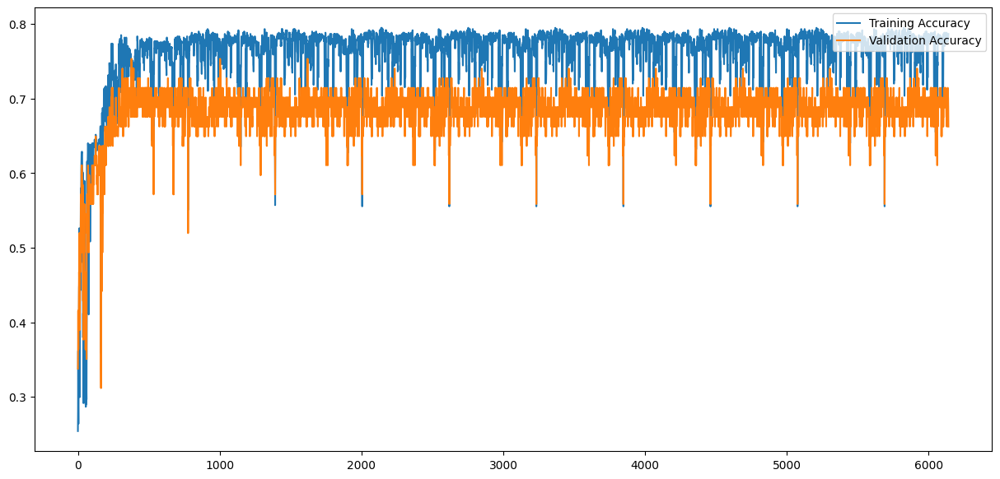

In [ ]:
# Plot for training and validation accuracy vs number of iterations
plt.figure(figsize = [15,7])
plt.plot(np.arange(0, epochs*len(y_train)), acc_train_list, label = "Training Accuracy")
plt.plot(np.arange(0, epochs*len(y_train)), acc_val_list, label = "Validation Accuracy")
plt.legend(loc = "upper right")
plt.show

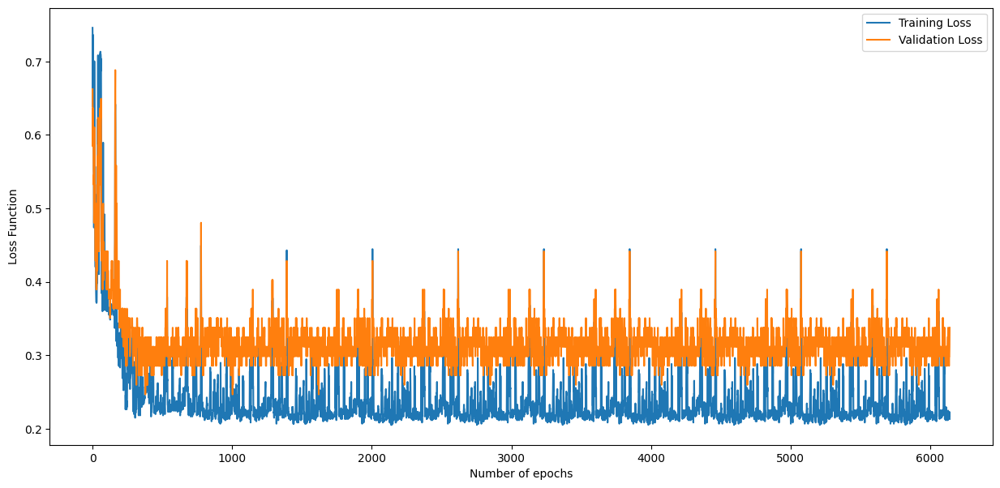

In [ ]:
# Plot for training and validation loss vs number of iterations
plt.figure(figsize = [15,7])
plt.plot(np.arange(0, epochs*len(y_train)), loss_train_list, label = "Training Loss")
plt.plot(np.arange(0, epochs*len(y_train)), loss_val_list, label = "Validation Loss")
plt.xlabel("Number of epochs")
plt.ylabel("Loss Function")
plt.legend(loc = "upper right")
plt.show()

In [ ]:
accuracy_dict

{'Weights: Zero, Bias: False': 0.7142857142857143,
 'Weights: Random, Bias: False': 0.7402597402597403,
 'Weights: Ones, Bias: False': 0.7142857142857143,
 'Weights: Zero, Bias: True': 0.7142857142857143,
 'Weights: Ones, Bias: True': 0.7272727272727273,
 'Weights: Random, Bias: True': 0.7402597402597403,
 'Adeline, Weights: Random, Bias: False': 0.7922077922077922}